# CatBoost basics

For this homework will use dataset Amazon Employee Access Challenge from [Kaggle](https://www.kaggle.com) competition for our experiments. Data can be downloaded [here](https://www.kaggle.com/c/amazon-employee-access-challenge/data).

As a result of this tutorial you need to provide a tsv file with answers.
There are 17 questions in this tutorial. The resulting tsv file should consist of 17 lines, each line should contain the number of the question, an answer to it and a tab separater between them. Questions are numbered from 1 to 17.
See an example of the resulting file here.

# !!! SET KERNEL TO `python36`!!!

Major package versions in Coursera notebook.

- python 3.6.2
- numpy 1.13.1
- pandas 0.20.3
- catboost 0.11.1
- scipy 0.19.1
- scikit-learn 0.19.0
- shap 0.20.2

In [1]:
# install some packages with pinned version
!pip install scipy==0.19.1 scikit-learn==0.19.0 shap==0.20.2

## Reading the data

Let's first download the data and put it to folder `amazon`. Now we will read this data from file.

In [2]:
import pandas as pd
import numpy as np
np.set_printoptions(precision=4)
import catboost
from catboost import datasets
from catboost import *

from grader_v2 import Grader

In [3]:
import scipy
import sklearn
import ipywidgets
#import ipython

import shap
for p in [np, pd, catboost, ipywidgets, scipy, sklearn]:
    print (p.__name__, p.__version__)

numpy 1.13.1
pandas 0.20.3
catboost 0.11.1
ipywidgets 7.0.0
scipy 0.19.1
sklearn 0.19.0


In [4]:
train_df, test_df = catboost.datasets.amazon()
train_df.head()

,ACTION,RESOURCE,MGR_ID,ROLE_ROLLUP_1,ROLE_ROLLUP_2,ROLE_DEPTNAME,ROLE_TITLE,ROLE_FAMILY_DESC,ROLE_FAMILY,ROLE_CODE
0,1,39353,85475,117961,118300,123472,117905,117906,290919,117908
1,1,17183,1540,117961,118343,123125,118536,118536,308574,118539
2,1,36724,14457,118219,118220,117884,117879,267952,19721,117880
3,1,36135,5396,117961,118343,119993,118321,240983,290919,118322
4,1,42680,5905,117929,117930,119569,119323,123932,19793,119325


In [5]:
grader = Grader()

## Preparing your data

Label values extraction

In [6]:
y = train_df.ACTION
X = train_df.drop('ACTION', axis=1)

Categorical features declaration

In [7]:
cat_features = list(range(0, X.shape[1]))
print(cat_features)

[0, 1, 2, 3, 4, 5, 6, 7, 8]


Now it makes sense to ananyze the dataset.
First you need to calculate how many positive and negative objects are present in the train dataset.

**Question 1:**

How many negative objects are present in the train dataset X?

In [8]:
y[y <= 0].shape[0]

1897

In [9]:
zero_count = y[y <= 0].shape[0]
grader.submit_tag('negative_samples', zero_count)

Current answer for task negative_samples is: 1897


**Question 2:**

How many positive objects are present in the train dataset X?

In [10]:
one_count = y[y > 0].shape[0]
grader.submit_tag('positive_samples', one_count)

Current answer for task positive_samples is: 30872


In [11]:
print('Zero count = ' + str(zero_count) + ', One count = ' + str(one_count))

Zero count = 1897, One count = 30872


Now for every feature you need to calculate number of unique values of this feature.

**Question 3:**
    
How many unique values has feature RESOURCE?

In [12]:
unique_vals_for_RESOURCE = X["RESOURCE"].nunique()
grader.submit_tag('resource_unique_values', unique_vals_for_RESOURCE)

Current answer for task resource_unique_values is: 7518


Now we can create a Pool object. This type is used for datasets in CatBoost. You can also use numpy array or dataframe. Working with Pool class is the most efficient way in terms of memory and speed. We recommend to create Pool from file in case if you have your data on disk or from FeaturesData if you use numpy.

In [13]:
import numpy as np
from catboost import Pool

pool1 = Pool(data=X, label=y, cat_features=cat_features)
#pool2 = Pool(data='/opt/conda/lib/python3.6/site-packages/catboost/cached_datasets/amazon/train.csv', delimiter=',', has_header=True)
pool2 = Pool(data=train_df, has_header=True)
pool3 = Pool(data=X, cat_features=cat_features)

print('Dataset shape')
print('dataset 1:' + str(pool1.shape) + '\ndataset 2:' + str(pool2.shape)  + '\ndataset 3:' + str(pool3.shape))

print('\n')
print('Column names')
print('dataset 1: ')
print(pool1.get_feature_names()) 
print('\ndataset 2:')
print(pool2.get_feature_names())
print('\ndataset 3:')
print(pool3.get_feature_names())

Dataset shape
dataset 1:(32769, 9)
dataset 2:(32769, 10)
dataset 3:(32769, 9)


Column names
dataset 1: 
['RESOURCE', 'MGR_ID', 'ROLE_ROLLUP_1', 'ROLE_ROLLUP_2', 'ROLE_DEPTNAME', 'ROLE_TITLE', 'ROLE_FAMILY_DESC', 'ROLE_FAMILY', 'ROLE_CODE']

dataset 2:
['ACTION', 'RESOURCE', 'MGR_ID', 'ROLE_ROLLUP_1', 'ROLE_ROLLUP_2', 'ROLE_DEPTNAME', 'ROLE_TITLE', 'ROLE_FAMILY_DESC', 'ROLE_FAMILY', 'ROLE_CODE']

dataset 3:
['RESOURCE', 'MGR_ID', 'ROLE_ROLLUP_1', 'ROLE_ROLLUP_2', 'ROLE_DEPTNAME', 'ROLE_TITLE', 'ROLE_FAMILY_DESC', 'ROLE_FAMILY', 'ROLE_CODE']


## Split your data into train and validation

When you will be training your model, you will have to detect overfitting and select best parameters. To do that you need to have a validation dataset.
Normally you would be using some random split, for example
`train_test_split` from `sklearn.model_selection`.
But for the purpose of this homework the train part will be the first 80% of the data and the evaluation part will be the last 20% of the data.

In [14]:
train_count = int(X.shape[0] * 0.8)

X_train = X.iloc[:train_count,:]
y_train = y[:train_count]
X_validation = X.iloc[train_count:, :]
y_validation = y[train_count:]

## Train your model

Now we will train our first model.

In [15]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=5,
    random_seed=0,
    learning_rate=0.1
)
model.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
    #logging_level='Silent'
    plot=True
)
print('Model is fitted: ' + str(model.is_fitted()))
print('Model params:')
print(model.get_params())

A Jupyter Widget

0:	learn: 0.5790122	test: 0.5797377	best: 0.5797377 (0)	total: 84.9ms	remaining: 339ms
1:	learn: 0.4926897	test: 0.4940680	best: 0.4940680 (1)	total: 121ms	remaining: 182ms
2:	learn: 0.4276522	test: 0.4296182	best: 0.4296182 (2)	total: 161ms	remaining: 107ms
3:	learn: 0.3766878	test: 0.3788872	best: 0.3788872 (3)	total: 224ms	remaining: 56ms
4:	learn: 0.3381318	test: 0.3397291	best: 0.3397291 (4)	total: 263ms	remaining: 0us

bestTest = 0.3397290883
bestIteration = 4

Model is fitted: True
Model params:
{'random_seed': 0, 'loss_function': 'Logloss', 'learning_rate': 0.1, 'iterations': 5}


## Stdout of the training

You can see in stdout values of the loss function on each iteration, or on each k-th iteration.
You can also see how much time passed since the start of the training and how much time is left.

In [16]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=15,
    verbose=3
)
model.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
)

0:	learn: 0.3007996	test: 0.3044268	best: 0.3044268 (0)	total: 23.6ms	remaining: 331ms
3:	learn: 0.1800237	test: 0.1674121	best: 0.1674121 (3)	total: 214ms	remaining: 588ms
6:	learn: 0.1706950	test: 0.1549520	best: 0.1549520 (6)	total: 360ms	remaining: 412ms
9:	learn: 0.1672391	test: 0.1495040	best: 0.1495040 (9)	total: 491ms	remaining: 245ms
12:	learn: 0.1645499	test: 0.1487789	best: 0.1487789 (12)	total: 658ms	remaining: 101ms
14:	learn: 0.1630092	test: 0.1469375	best: 0.1469375 (14)	total: 759ms	remaining: 0us

bestTest = 0.1469374586
bestIteration = 14



## Random seed

If you don't specify random_seed then random seed will be set to a new value each time.
After the training has finished you can look on the value of the random seed that was set.
If you train again with this random_seed, you will get the same results.

In [17]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=5
)
model.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
)

0:	learn: 0.3007996	test: 0.3044268	best: 0.3044268 (0)	total: 25.9ms	remaining: 104ms
1:	learn: 0.2161146	test: 0.2152075	best: 0.2152075 (1)	total: 102ms	remaining: 154ms
2:	learn: 0.1879597	test: 0.1797290	best: 0.1797290 (2)	total: 150ms	remaining: 100ms
3:	learn: 0.1800237	test: 0.1674121	best: 0.1674121 (3)	total: 225ms	remaining: 56.4ms
4:	learn: 0.1732668	test: 0.1581682	best: 0.1581682 (4)	total: 306ms	remaining: 0us

bestTest = 0.1581682309
bestIteration = 4



In [18]:
random_seed = model.random_seed_
print('Used random seed = ' + str(random_seed))
model = CatBoostClassifier(
    iterations=5,
    random_seed=random_seed
)
model.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
)

Used random seed = 0
0:	learn: 0.3007996	test: 0.3044268	best: 0.3044268 (0)	total: 25.1ms	remaining: 100ms
1:	learn: 0.2161146	test: 0.2152075	best: 0.2152075 (1)	total: 99.6ms	remaining: 149ms
2:	learn: 0.1879597	test: 0.1797290	best: 0.1797290 (2)	total: 166ms	remaining: 111ms
3:	learn: 0.1800237	test: 0.1674121	best: 0.1674121 (3)	total: 264ms	remaining: 66ms
4:	learn: 0.1732668	test: 0.1581682	best: 0.1581682 (4)	total: 352ms	remaining: 0us

bestTest = 0.1581682309
bestIteration = 4



Try training 10 models with parameters and calculate mean and the standart deviation of Logloss error on validation dataset.

**Question 4:**

What is the mean value of the Logloss metric on validation dataset (X_validation, y_validation) after 10 times training `CatBoostClassifier` with different random seeds in the following way:

`model = CatBoostClassifier(
    iterations=300,
    learning_rate=0.1,
    random_seed={my_random_seed}
)
model.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
)
`

In [19]:
logloss_iter = []

for seed in range(0,10):
    print("seed=", seed)
    model = CatBoostClassifier(
        iterations=300,
        learning_rate=0.1,
        random_seed=seed
    )
    model.fit(
        X_train, y_train,
        cat_features=cat_features,
        eval_set=(X_validation, y_validation),
        logging_level='Silent'
    )
    best_iter = model.best_iteration_
    logloss_iter.append(model.get_evals_result()["validation_0"]["Logloss"][best_iter])
    print("best_iter=",best_iter, "logloss=", model.get_evals_result()["validation_0"]["Logloss"][best_iter])

seed= 0
best_iter= 262 logloss= 0.1377092210691794
seed= 1
best_iter= 197 logloss= 0.13908961147685442
seed= 2
best_iter= 277 logloss= 0.13890494877003
seed= 3
best_iter= 177 logloss= 0.13718808123056636
seed= 4
best_iter= 212 logloss= 0.13969110529935072
seed= 5
best_iter= 279 logloss= 0.13802919472444256
seed= 6
best_iter= 241 logloss= 0.1371345869369057
seed= 7
best_iter= 219 logloss= 0.13801195200538616
seed= 8
best_iter= 212 logloss= 0.13811303812914325
seed= 9
best_iter= 286 logloss= 0.13793673162140377


In [20]:
mean = np.mean(logloss_iter)
grader.submit_tag('logloss_mean', mean)

Current answer for task logloss_mean is: 0.138180847126


**Question 5:**

What is the standard deviation of it?

In [21]:
stddev = np.std(logloss_iter)
grader.submit_tag('logloss_std', stddev)

Current answer for task logloss_std is: 0.000777781825619


## Metrics calculation and graph plotting

When experimenting with Jupyter notebook you can see graphs of different errors during training.
To do that you need to use `plot=True` parameter.

In [22]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=50,
    random_seed=63,
    learning_rate=0.1,
    custom_loss=['Accuracy']
)
model.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
    logging_level='Silent',
    plot=True
)

A Jupyter Widget

**Question 6:**

What is the value of the accuracy metric value on evaluation dataset after training with parameters `iterations=50`, `random_seed=63`, `learning_rate=0.1`?

In [23]:
model.get_best_score()["validation_0"]["Accuracy"]

0.9539212694537686

In [24]:
accuracy = model.get_best_score()["validation_0"]["Accuracy"]
grader.submit_tag('accuracy_6', accuracy)

Current answer for task accuracy_6 is: 0.9539212694537686


## Model comparison

In [25]:
model1 = CatBoostClassifier(
    learning_rate=0.5,
    iterations=1000,
    random_seed=64,
    train_dir='learning_rate_0.5',
    custom_loss = ['Accuracy']
)

model2 = CatBoostClassifier(
    learning_rate=0.05,
    iterations=1000,
    random_seed=64,
    train_dir='learning_rate_0.05',
    custom_loss = ['Accuracy']
)
model1.fit(
    X_train, y_train,
    eval_set=(X_validation, y_validation),
    cat_features=cat_features,
    verbose=100
)
model2.fit(
    X_train, y_train,
    eval_set=(X_validation, y_validation),
    cat_features=cat_features,
    verbose=100
)

0:	learn: 0.3007996	test: 0.3044268	best: 0.3044268 (0)	total: 44.4ms	remaining: 44.3s
100:	learn: 0.1417823	test: 0.1411395	best: 0.1404355 (86)	total: 12.5s	remaining: 1m 51s
200:	learn: 0.1325707	test: 0.1445884	best: 0.1404355 (86)	total: 28.6s	remaining: 1m 53s
300:	learn: 0.1282814	test: 0.1448701	best: 0.1404355 (86)	total: 44.6s	remaining: 1m 43s
400:	learn: 0.1248521	test: 0.1454781	best: 0.1404355 (86)	total: 57.5s	remaining: 1m 25s
500:	learn: 0.1211002	test: 0.1478302	best: 0.1404355 (86)	total: 1m 18s	remaining: 1m 17s
600:	learn: 0.1175793	test: 0.1497477	best: 0.1404355 (86)	total: 1m 29s	remaining: 59.3s
700:	learn: 0.1146547	test: 0.1512002	best: 0.1404355 (86)	total: 1m 46s	remaining: 45.3s
800:	learn: 0.1114917	test: 0.1525247	best: 0.1404355 (86)	total: 2m 9s	remaining: 32.1s
900:	learn: 0.1088408	test: 0.1548138	best: 0.1404355 (86)	total: 2m 28s	remaining: 16.3s
999:	learn: 0.1069592	test: 0.1553679	best: 0.1404355 (86)	total: 2m 43s	remaining: 0us

bestTest = 0.1

In [26]:
from catboost import MetricVisualizer
MetricVisualizer(['learning_rate_0.05', 'learning_rate_0.5']).start()

A Jupyter Widget

**Question 7:**

Try training these models for 1000 iterations. Which model will give better best resulting Accuracy on validation dataset?
By best resulting accuracy we mean accuracy on best iteration, which might be not the last iteration.

In [27]:
print (model1.get_best_score()["validation_0"]["Accuracy"], model2.get_best_score()["validation_0"]["Accuracy"])

best_model_name = 'learning_rate_0.5' if model1.get_best_score()["validation_0"]["Accuracy"] > model2.get_best_score()["validation_0"]["Accuracy"] else 'learning_rate_0.05'

print (best_model_name)

0.954226426609704 0.9551418980775099
learning_rate_0.05


In [28]:
#best_model_name =  # one of 'learning_rate_0.5', 'learning_rate_0.05'

grader.submit_tag('best_model_name', best_model_name)

Current answer for task best_model_name is: learning_rate_0.05


## Best iteration

If a validation dataset is present then after training, the model is shrinked to a number of trees when it got best evaluation metric value on validation dataset.
By default evaluation metric is the optimized metric. But you can set evaluation metric to some other metric.
In the example below evaluation metric is `Accuracy`.

In [29]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=100,
    random_seed=63,
    learning_rate=0.5,
    eval_metric='Accuracy'
)
model.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
    logging_level='Silent',
    plot=True
)

A Jupyter Widget

In [30]:
print('Tree count: ' + str(model.tree_count_))

Tree count: 72


If you don't want the model to be shrinked, you can set `use_best_model=False`

In [31]:
model = CatBoostClassifier(
    iterations=100,
    random_seed=63,
    learning_rate=0.5,
    eval_metric='Accuracy',
    use_best_model=False
)
model.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
    logging_level='Silent',
    plot=True
)

A Jupyter Widget

**Question 8:**
    
What will be the number of trees in the resulting model after training with validation dataset with parameters `iterations=100`, ` learning_rate=0.5`, `eval_metric='Accuracy'` and with parameter `use_best_model=False`

In [32]:
print('Tree count: ' + str(model.tree_count_))

Tree count: 100


In [33]:
tree_count = model.tree_count_
grader.submit_tag('num_trees', tree_count)

Current answer for task num_trees is: 100


## Cross-validation

The next functionality you need to know about is cross-validation.
For unbalanced datasets stratified cross-validation can be useful.

In [34]:
from catboost import cv

params = {}
params['loss_function'] = 'Logloss'
params['iterations'] = 80
params['custom_loss'] = 'AUC'
params['random_seed'] = 63
params['learning_rate'] = 0.5

cv_data = cv(
    params = params,
    pool = Pool(X, label=y, cat_features=cat_features),
    fold_count=5,
    inverted=False,
    shuffle=True,
    partition_random_seed=0,
    plot=True,
    stratified=True,
    verbose=False
)

A Jupyter Widget

Cross-validation returns specified metric values on every iteration (or every k-th iteration, if you specify so)

In [35]:
print(cv_data[0:4])

   test-AUC-mean  test-AUC-std  test-Logloss-mean  test-Logloss-std  \
0       0.500000      0.000000           0.302197          0.000080   
1       0.625621      0.122336           0.222651          0.014472   
2       0.799508      0.012871           0.179930          0.004739   
3       0.824558      0.013151           0.165090          0.003799   

   train-AUC-mean  train-AUC-std  train-Logloss-mean  train-Logloss-std  
0        0.499984       0.000017            0.302203           0.000050  
1        0.614679       0.109875            0.225825           0.010991  
2        0.758325       0.022924            0.190024           0.004146  
3        0.781285       0.017559            0.178807           0.003176  


Let's look on mean value and standard deviation of Logloss for cv on best iteration.

In [36]:
best_value = np.min(cv_data['test-Logloss-mean'])
best_iter = np.argmin(cv_data['test-Logloss-mean'])

print('Best validation Logloss score, not stratified: {:.4f}±{:.4f} on step {}'.format(
    best_value,
    cv_data['test-Logloss-std'][best_iter],
    best_iter)
)

Best validation Logloss score, not stratified: 0.1409±0.0056 on step 65


**Question 9:**

Try running stratified cross-validation with the same parameters. What will be mean of Logloss metric on test of the stratified cross-validation on the best iteration?

In [37]:
mean_on_best_iteration = best_value
grader.submit_tag('mean_logloss_cv', mean_on_best_iteration)

Current answer for task mean_logloss_cv is: 0.140862080899


**Question 10:**

Try running stratified cross-validation with the same parameters. What will be the standard deviation of Logloss metric of the stratified cross-validation on the best iteration?

In [38]:
std_on_best_iteration = cv_data['test-Logloss-std'][best_iter]
grader.submit_tag('logloss_std_1', std_on_best_iteration)

Current answer for task logloss_std_1 is: 0.0055622410138


## Overfitting detector

A useful feature of the library is overfitting detector.
Let's try training the model with early stopping.

In [39]:
model_with_early_stop = CatBoostClassifier(
    iterations=200,
    random_seed=63,
    learning_rate=0.5,
    od_type='Iter',
    od_wait=20,
    eval_metric = 'AUC'
)
model_with_early_stop.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
    logging_level='Silent',
    plot=True
)

A Jupyter Widget

**Question 11:**

Now try training the model with the same parameters and with overfitting detector, but with `eval_metric='AUC'`
What will be the number of iterations after which the training will stop?
(Not the number of trees in the resulting model, but the number of iterations that the algorithm will perform befor training).

In [40]:
iterations_count = model_with_early_stop.best_iteration_
grader.submit_tag('iterations_overfitting', iterations_count)

Current answer for task iterations_overfitting is: 64


## Snapshotting

If you train for long time, for example for several hours, you need to save snapshots.
Otherwise if your laptop or your server will reboot, you will loose all the progress.
To do that you need to specify `snapshot_file` parameter.
Try running the code below and interrupting the kernel after short time.
Then try running the same cell again.
The training will start from the iteration when the training was interrupted.
Note that all additional files are written by default into `catboost_info` directory. It can be changed using `train_dir` parameter. So the snapshot file will be there.

In [41]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=40,
    save_snapshot=True,
    snapshot_file='snapshot.bkp',
    random_seed=43
)
model.fit(
    X_train, y_train,
    eval_set=(X_validation, y_validation),
    cat_features=cat_features,
    logging_level='Verbose'
)


bestTest = 0.1417246297
bestIteration = 44



## Model predictions

There are multiple ways to do predictions.
The easiest one is to call predict or predict_proba.
You also can make predictions using C++ code. For that see [documentation](https://tech.yandex.com/catboost/doc/dg/concepts/c-plus-plus-api-docpage/).

In [42]:
print(model.predict_proba(data=X_validation))

[[ 0.014   0.986 ]
 [ 0.0143  0.9857]
 [ 0.005   0.995 ]
 ..., 
 [ 0.0062  0.9938]
 [ 0.3846  0.6154]
 [ 0.0245  0.9755]]


In [43]:
print(model.predict(data=X_validation))

[ 1.  1.  1. ...,  1.  1.  1.]


For binary classification resulting value is not necessary a value in `[0,1]`. It is some numeric value. To get the probability out of this value you need to calculate sigmoid of that value.

In [44]:
raw_pred = model.predict(data=X_validation, prediction_type='RawFormulaVal')
print(raw_pred)

[ 4.2568  4.2346  5.2993 ...,  5.0691  0.4699  3.6823]


In [45]:
import math
def sigmoid(x):
    return 1 / (1 + math.exp(-x))
probabilities = [sigmoid(x) for x in raw_pred]
print(np.array(probabilities))

[ 0.986   0.9857  0.995  ...,  0.9938  0.6154  0.9755]


## Staged prediction

CatBoost also supports staged prediction - when you want to have a prediction on each object on each iteration (or on each k-th iteration). This can be used if you want to calculate the values of some custom metric using the predictions.

In [46]:
predictions_gen = model.staged_predict_proba(data=X_validation, ntree_start=0, ntree_end=5, eval_period=1)
for iteration, predictions in enumerate(predictions_gen):
    print('Iteration ' + str(iteration) + ', predictions:')
    print(predictions)

Iteration 0, predictions:
[[ 0.228  0.772]
 [ 0.228  0.772]
 [ 0.228  0.772]
 ..., 
 [ 0.228  0.772]
 [ 0.228  0.772]
 [ 0.228  0.772]]
Iteration 1, predictions:
[[ 0.1121  0.8879]
 [ 0.1273  0.8727]
 [ 0.1121  0.8879]
 ..., 
 [ 0.1121  0.8879]
 [ 0.221   0.779 ]
 [ 0.1526  0.8474]]
Iteration 2, predictions:
[[ 0.0599  0.9401]
 [ 0.0686  0.9314]
 [ 0.0599  0.9401]
 ..., 
 [ 0.0599  0.9401]
 [ 0.3378  0.6622]
 [ 0.0833  0.9167]]
Iteration 3, predictions:
[[ 0.0424  0.9576]
 [ 0.0486  0.9514]
 [ 0.0424  0.9576]
 ..., 
 [ 0.0424  0.9576]
 [ 0.3799  0.6201]
 [ 0.0594  0.9406]]
Iteration 4, predictions:
[[ 0.0267  0.9733]
 [ 0.0435  0.9565]
 [ 0.0267  0.9733]
 ..., 
 [ 0.0379  0.9621]
 [ 0.3549  0.6451]
 [ 0.0531  0.9469]]


/opt/conda/envs/python36/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: generator 'CatBoost._staged_predict' raised StopIteration
  


## Metric evaluation on a new dataset

You can also calculate metrics directly after training.

In [47]:
metrics = model.eval_metrics(data=pool1, metrics=['Logloss','AUC'], plot=True)

In [48]:
print('AUC values:')
print(np.array(metrics['AUC']))

AUC values:
[ 0.4999  0.6183  0.878   0.9372  0.9332  0.9456  0.9505  0.9542  0.9548
  0.9562  0.9561  0.9578  0.9665  0.9667  0.9668  0.9668  0.9703  0.9706
  0.9719  0.9716  0.9726  0.9729  0.9728  0.9729  0.973   0.973   0.973
  0.9744  0.9743  0.9753  0.9782  0.9782  0.9782  0.9782  0.9782  0.9782
  0.9781  0.9781  0.9779  0.9818  0.9822  0.9823  0.9822  0.9824  0.9837
  0.9835  0.9835  0.9835  0.9834  0.9834]


A Jupyter Widget

**Question 12:**

Now train a model in the following way:

`
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=1000,
    learning_rate=0.05,
    random_seed=43
)
model.fit(
    X_train, y_train,
    eval_set=(X_validation, y_validation),
    cat_features=cat_features,
    logging_level='Verbose'
)
`

What will be the AUC value on 550 iteration if evaluation metrics on the initial X dataset?

In [49]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=1000,
    learning_rate=0.05,
    random_seed=43
)
model.fit(
    X_train, y_train,
    eval_set=(X_validation, y_validation),
    cat_features=cat_features,
    logging_level='Verbose'
)

0:	learn: 0.6335962	test: 0.6340206	best: 0.6340206 (0)	total: 75.4ms	remaining: 1m 15s
1:	learn: 0.5800784	test: 0.5804728	best: 0.5804728 (1)	total: 172ms	remaining: 1m 25s
2:	learn: 0.5348017	test: 0.5355652	best: 0.5355652 (2)	total: 282ms	remaining: 1m 33s
3:	learn: 0.4948441	test: 0.4962757	best: 0.4962757 (3)	total: 404ms	remaining: 1m 40s
4:	learn: 0.4596700	test: 0.4614066	best: 0.4614066 (4)	total: 515ms	remaining: 1m 42s
5:	learn: 0.4291247	test: 0.4309207	best: 0.4309207 (5)	total: 682ms	remaining: 1m 52s
6:	learn: 0.4027804	test: 0.4048004	best: 0.4048004 (6)	total: 789ms	remaining: 1m 51s
7:	learn: 0.3792210	test: 0.3813320	best: 0.3813320 (7)	total: 865ms	remaining: 1m 47s
8:	learn: 0.3570632	test: 0.3594469	best: 0.3594469 (8)	total: 954ms	remaining: 1m 45s
9:	learn: 0.3389886	test: 0.3409673	best: 0.3409673 (9)	total: 1.08s	remaining: 1m 47s
10:	learn: 0.3225536	test: 0.3249813	best: 0.3249813 (10)	total: 1.18s	remaining: 1m 46s
11:	learn: 0.3096544	test: 0.3120757	bes

95:	learn: 0.1615018	test: 0.1453321	best: 0.1453321 (95)	total: 9.23s	remaining: 1m 26s
96:	learn: 0.1614838	test: 0.1453240	best: 0.1453240 (96)	total: 9.33s	remaining: 1m 26s
97:	learn: 0.1613493	test: 0.1451730	best: 0.1451730 (97)	total: 9.43s	remaining: 1m 26s
98:	learn: 0.1612984	test: 0.1451546	best: 0.1451546 (98)	total: 9.53s	remaining: 1m 26s
99:	learn: 0.1611222	test: 0.1449381	best: 0.1449381 (99)	total: 9.68s	remaining: 1m 27s
100:	learn: 0.1609553	test: 0.1447964	best: 0.1447964 (100)	total: 9.8s	remaining: 1m 27s
101:	learn: 0.1608943	test: 0.1447115	best: 0.1447115 (101)	total: 9.92s	remaining: 1m 27s
102:	learn: 0.1608000	test: 0.1446959	best: 0.1446959 (102)	total: 10s	remaining: 1m 27s
103:	learn: 0.1607811	test: 0.1446851	best: 0.1446851 (103)	total: 10.1s	remaining: 1m 26s
104:	learn: 0.1607245	test: 0.1446364	best: 0.1446364 (104)	total: 10.2s	remaining: 1m 26s
105:	learn: 0.1605858	test: 0.1444034	best: 0.1444034 (105)	total: 10.3s	remaining: 1m 26s
106:	learn: 

186:	learn: 0.1561934	test: 0.1412981	best: 0.1412801 (185)	total: 17.5s	remaining: 1m 16s
187:	learn: 0.1561865	test: 0.1412822	best: 0.1412801 (185)	total: 17.6s	remaining: 1m 16s
188:	learn: 0.1561855	test: 0.1412821	best: 0.1412801 (185)	total: 17.7s	remaining: 1m 15s
189:	learn: 0.1561630	test: 0.1412833	best: 0.1412801 (185)	total: 17.8s	remaining: 1m 15s
190:	learn: 0.1560906	test: 0.1412598	best: 0.1412598 (190)	total: 17.9s	remaining: 1m 15s
191:	learn: 0.1560763	test: 0.1412665	best: 0.1412598 (190)	total: 17.9s	remaining: 1m 15s
192:	learn: 0.1560762	test: 0.1412669	best: 0.1412598 (190)	total: 18s	remaining: 1m 15s
193:	learn: 0.1560696	test: 0.1412523	best: 0.1412523 (193)	total: 18.1s	remaining: 1m 15s
194:	learn: 0.1560403	test: 0.1412412	best: 0.1412412 (194)	total: 18.1s	remaining: 1m 14s
195:	learn: 0.1560019	test: 0.1411910	best: 0.1411910 (195)	total: 18.2s	remaining: 1m 14s
196:	learn: 0.1559851	test: 0.1411918	best: 0.1411910 (195)	total: 18.3s	remaining: 1m 14s
1

277:	learn: 0.1518385	test: 0.1393221	best: 0.1393071 (276)	total: 26.3s	remaining: 1m 8s
278:	learn: 0.1517941	test: 0.1393123	best: 0.1393071 (276)	total: 26.4s	remaining: 1m 8s
279:	learn: 0.1517207	test: 0.1392926	best: 0.1392926 (279)	total: 26.5s	remaining: 1m 8s
280:	learn: 0.1516382	test: 0.1392190	best: 0.1392190 (280)	total: 26.6s	remaining: 1m 8s
281:	learn: 0.1516030	test: 0.1392211	best: 0.1392190 (280)	total: 26.7s	remaining: 1m 7s
282:	learn: 0.1515593	test: 0.1392389	best: 0.1392190 (280)	total: 26.8s	remaining: 1m 7s
283:	learn: 0.1514680	test: 0.1392362	best: 0.1392190 (280)	total: 27s	remaining: 1m 7s
284:	learn: 0.1514214	test: 0.1392167	best: 0.1392167 (284)	total: 27.1s	remaining: 1m 7s
285:	learn: 0.1513972	test: 0.1392374	best: 0.1392167 (284)	total: 27.2s	remaining: 1m 7s
286:	learn: 0.1513919	test: 0.1392254	best: 0.1392167 (284)	total: 27.3s	remaining: 1m 7s
287:	learn: 0.1513775	test: 0.1392437	best: 0.1392167 (284)	total: 27.3s	remaining: 1m 7s
288:	learn: 

369:	learn: 0.1490723	test: 0.1389852	best: 0.1389079 (354)	total: 37.2s	remaining: 1m 3s
370:	learn: 0.1490125	test: 0.1389267	best: 0.1389079 (354)	total: 37.3s	remaining: 1m 3s
371:	learn: 0.1489802	test: 0.1389401	best: 0.1389079 (354)	total: 37.4s	remaining: 1m 3s
372:	learn: 0.1489752	test: 0.1389511	best: 0.1389079 (354)	total: 37.5s	remaining: 1m 3s
373:	learn: 0.1489643	test: 0.1389569	best: 0.1389079 (354)	total: 37.6s	remaining: 1m 2s
374:	learn: 0.1489600	test: 0.1389628	best: 0.1389079 (354)	total: 37.7s	remaining: 1m 2s
375:	learn: 0.1489555	test: 0.1389642	best: 0.1389079 (354)	total: 37.8s	remaining: 1m 2s
376:	learn: 0.1487916	test: 0.1389002	best: 0.1389002 (376)	total: 37.9s	remaining: 1m 2s
377:	learn: 0.1487793	test: 0.1389034	best: 0.1389002 (376)	total: 38.1s	remaining: 1m 2s
378:	learn: 0.1487651	test: 0.1389139	best: 0.1389002 (376)	total: 38.2s	remaining: 1m 2s
379:	learn: 0.1487248	test: 0.1389232	best: 0.1389002 (376)	total: 38.3s	remaining: 1m 2s
380:	learn

463:	learn: 0.1470088	test: 0.1390580	best: 0.1389002 (376)	total: 47.8s	remaining: 55.2s
464:	learn: 0.1470020	test: 0.1390678	best: 0.1389002 (376)	total: 47.9s	remaining: 55.1s
465:	learn: 0.1469683	test: 0.1390107	best: 0.1389002 (376)	total: 48s	remaining: 55s
466:	learn: 0.1469441	test: 0.1390277	best: 0.1389002 (376)	total: 48.1s	remaining: 54.8s
467:	learn: 0.1469385	test: 0.1390203	best: 0.1389002 (376)	total: 48.1s	remaining: 54.7s
468:	learn: 0.1469273	test: 0.1390316	best: 0.1389002 (376)	total: 48.3s	remaining: 54.7s
469:	learn: 0.1469103	test: 0.1390446	best: 0.1389002 (376)	total: 48.4s	remaining: 54.5s
470:	learn: 0.1468996	test: 0.1390649	best: 0.1389002 (376)	total: 48.5s	remaining: 54.4s
471:	learn: 0.1468762	test: 0.1390421	best: 0.1389002 (376)	total: 48.6s	remaining: 54.3s
472:	learn: 0.1468553	test: 0.1390332	best: 0.1389002 (376)	total: 48.7s	remaining: 54.2s
473:	learn: 0.1468402	test: 0.1390413	best: 0.1389002 (376)	total: 48.7s	remaining: 54.1s
474:	learn: 0.

556:	learn: 0.1450949	test: 0.1389156	best: 0.1389002 (376)	total: 57s	remaining: 45.3s
557:	learn: 0.1450919	test: 0.1389237	best: 0.1389002 (376)	total: 57.1s	remaining: 45.2s
558:	learn: 0.1450841	test: 0.1389280	best: 0.1389002 (376)	total: 57.2s	remaining: 45.1s
559:	learn: 0.1450821	test: 0.1389403	best: 0.1389002 (376)	total: 57.3s	remaining: 45s
560:	learn: 0.1450722	test: 0.1389308	best: 0.1389002 (376)	total: 57.4s	remaining: 44.9s
561:	learn: 0.1450673	test: 0.1389353	best: 0.1389002 (376)	total: 57.5s	remaining: 44.8s
562:	learn: 0.1450491	test: 0.1389284	best: 0.1389002 (376)	total: 57.6s	remaining: 44.7s
563:	learn: 0.1450469	test: 0.1389400	best: 0.1389002 (376)	total: 57.7s	remaining: 44.6s
564:	learn: 0.1450455	test: 0.1389347	best: 0.1389002 (376)	total: 57.8s	remaining: 44.5s
565:	learn: 0.1450416	test: 0.1389322	best: 0.1389002 (376)	total: 57.9s	remaining: 44.4s
566:	learn: 0.1450392	test: 0.1389326	best: 0.1389002 (376)	total: 58s	remaining: 44.3s
567:	learn: 0.14

649:	learn: 0.1441097	test: 0.1388242	best: 0.1387695 (626)	total: 1m 5s	remaining: 35.5s
650:	learn: 0.1440908	test: 0.1388074	best: 0.1387695 (626)	total: 1m 5s	remaining: 35.4s
651:	learn: 0.1440901	test: 0.1388041	best: 0.1387695 (626)	total: 1m 6s	remaining: 35.3s
652:	learn: 0.1440849	test: 0.1387931	best: 0.1387695 (626)	total: 1m 6s	remaining: 35.2s
653:	learn: 0.1440826	test: 0.1387964	best: 0.1387695 (626)	total: 1m 6s	remaining: 35.1s
654:	learn: 0.1440644	test: 0.1387772	best: 0.1387695 (626)	total: 1m 6s	remaining: 35s
655:	learn: 0.1440592	test: 0.1387704	best: 0.1387695 (626)	total: 1m 6s	remaining: 34.8s
656:	learn: 0.1440530	test: 0.1387698	best: 0.1387695 (626)	total: 1m 6s	remaining: 34.7s
657:	learn: 0.1440235	test: 0.1387964	best: 0.1387695 (626)	total: 1m 6s	remaining: 34.6s
658:	learn: 0.1440144	test: 0.1387968	best: 0.1387695 (626)	total: 1m 6s	remaining: 34.5s
659:	learn: 0.1439805	test: 0.1387642	best: 0.1387642 (659)	total: 1m 6s	remaining: 34.4s
660:	learn: 

740:	learn: 0.1427700	test: 0.1388102	best: 0.1387023 (727)	total: 1m 14s	remaining: 26.1s
741:	learn: 0.1427656	test: 0.1388190	best: 0.1387023 (727)	total: 1m 14s	remaining: 26s
742:	learn: 0.1427192	test: 0.1388221	best: 0.1387023 (727)	total: 1m 14s	remaining: 25.9s
743:	learn: 0.1427171	test: 0.1388218	best: 0.1387023 (727)	total: 1m 15s	remaining: 25.8s
744:	learn: 0.1427162	test: 0.1388273	best: 0.1387023 (727)	total: 1m 15s	remaining: 25.7s
745:	learn: 0.1427125	test: 0.1388339	best: 0.1387023 (727)	total: 1m 15s	remaining: 25.6s
746:	learn: 0.1427027	test: 0.1388312	best: 0.1387023 (727)	total: 1m 15s	remaining: 25.5s
747:	learn: 0.1426262	test: 0.1387699	best: 0.1387023 (727)	total: 1m 15s	remaining: 25.4s
748:	learn: 0.1426228	test: 0.1387596	best: 0.1387023 (727)	total: 1m 15s	remaining: 25.3s
749:	learn: 0.1426129	test: 0.1387657	best: 0.1387023 (727)	total: 1m 15s	remaining: 25.2s
750:	learn: 0.1426096	test: 0.1387722	best: 0.1387023 (727)	total: 1m 15s	remaining: 25.1s
7

831:	learn: 0.1418077	test: 0.1387957	best: 0.1386987 (763)	total: 1m 23s	remaining: 17s
832:	learn: 0.1418026	test: 0.1387911	best: 0.1386987 (763)	total: 1m 24s	remaining: 16.9s
833:	learn: 0.1418022	test: 0.1387915	best: 0.1386987 (763)	total: 1m 24s	remaining: 16.7s
834:	learn: 0.1418010	test: 0.1387918	best: 0.1386987 (763)	total: 1m 24s	remaining: 16.6s
835:	learn: 0.1417987	test: 0.1388011	best: 0.1386987 (763)	total: 1m 24s	remaining: 16.5s
836:	learn: 0.1417941	test: 0.1387966	best: 0.1386987 (763)	total: 1m 24s	remaining: 16.4s
837:	learn: 0.1417858	test: 0.1387856	best: 0.1386987 (763)	total: 1m 24s	remaining: 16.3s
838:	learn: 0.1417828	test: 0.1387885	best: 0.1386987 (763)	total: 1m 24s	remaining: 16.2s
839:	learn: 0.1417787	test: 0.1387883	best: 0.1386987 (763)	total: 1m 24s	remaining: 16.1s
840:	learn: 0.1417786	test: 0.1387926	best: 0.1386987 (763)	total: 1m 24s	remaining: 16s
841:	learn: 0.1417773	test: 0.1388001	best: 0.1386987 (763)	total: 1m 24s	remaining: 15.9s
842

922:	learn: 0.1409207	test: 0.1387544	best: 0.1386987 (763)	total: 1m 32s	remaining: 7.71s
923:	learn: 0.1408814	test: 0.1387305	best: 0.1386987 (763)	total: 1m 32s	remaining: 7.61s
924:	learn: 0.1408794	test: 0.1387303	best: 0.1386987 (763)	total: 1m 32s	remaining: 7.51s
925:	learn: 0.1408766	test: 0.1387352	best: 0.1386987 (763)	total: 1m 32s	remaining: 7.41s
926:	learn: 0.1408752	test: 0.1387341	best: 0.1386987 (763)	total: 1m 32s	remaining: 7.31s
927:	learn: 0.1408736	test: 0.1387340	best: 0.1386987 (763)	total: 1m 32s	remaining: 7.21s
928:	learn: 0.1408676	test: 0.1387375	best: 0.1386987 (763)	total: 1m 33s	remaining: 7.11s
929:	learn: 0.1408675	test: 0.1387374	best: 0.1386987 (763)	total: 1m 33s	remaining: 7.01s
930:	learn: 0.1408312	test: 0.1387298	best: 0.1386987 (763)	total: 1m 33s	remaining: 6.91s
931:	learn: 0.1408077	test: 0.1387478	best: 0.1386987 (763)	total: 1m 33s	remaining: 6.81s
932:	learn: 0.1408004	test: 0.1387485	best: 0.1386987 (763)	total: 1m 33s	remaining: 6.71s

In [50]:
metrics = model.eval_metrics(data=pool1, metrics=['Logloss','AUC'], plot=True)

In [51]:
auc_value = np.array(metrics['AUC'])[550]
grader.submit_tag('auc_550', auc_value)

Current answer for task auc_550 is: 0.984975697775


## Feature importances

Now we will learn how to understand which features are the most important ones. Let's first train the model that will not use feature combinations. To forbid feature combinations you need to use 'max_ctr_complexity=1'. This will speed up the training by a lot, but it will reduce the resulting quality. 

In [52]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=300,
    max_ctr_complexity=4,
    random_seed=43
)
model.fit(
    X, y,
    cat_features=cat_features,
    verbose=50
)

A Jupyter Widget

0:	learn: 0.5454508	total: 134ms	remaining: 40s
50:	learn: 0.1562605	total: 3.85s	remaining: 18.8s
100:	learn: 0.1493646	total: 8.49s	remaining: 16.7s
150:	learn: 0.1451569	total: 14.2s	remaining: 14s
200:	learn: 0.1432905	total: 19.9s	remaining: 9.81s
250:	learn: 0.1417401	total: 25.3s	remaining: 4.94s
299:	learn: 0.1402619	total: 30.4s	remaining: 0us


Let's see which features are most important for the model without feature combinations.

In [53]:
importances = model.get_feature_importance(prettified=True)
print(importances)

[('RESOURCE', 24.73509920590257), ('MGR_ID', 17.449161787258667), ('ROLE_DEPTNAME', 15.316223709876839), ('ROLE_ROLLUP_2', 11.490154799409593), ('ROLE_TITLE', 10.71183545081703), ('ROLE_FAMILY_DESC', 8.946143168072846), ('ROLE_FAMILY', 4.379723768290924), ('ROLE_CODE', 3.772023536810539), ('ROLE_ROLLUP_1', 3.199634573560977)]


** Question 13: **

Try training the model without the restriction of combinations, with other parameters set to the same values.
What will be top 3 most important features for this model?

In [54]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=300,
    max_ctr_complexity=len(cat_features),
    random_seed=43
)
model.fit(
    X, y,
    cat_features=cat_features,
    verbose=50
)

0:	learn: 0.5454508	total: 96.4ms	remaining: 28.8s
50:	learn: 0.1553586	total: 4.19s	remaining: 20.5s
100:	learn: 0.1491496	total: 8.78s	remaining: 17.3s
150:	learn: 0.1455135	total: 13.9s	remaining: 13.7s
200:	learn: 0.1431526	total: 20.5s	remaining: 10.1s
250:	learn: 0.1412734	total: 26s	remaining: 5.07s
299:	learn: 0.1393775	total: 31.1s	remaining: 0us


In [55]:
importances = model.get_feature_importance(prettified=True)
i_a = np.array(importances)[:, 0][:3]

In [56]:
top3 = "{},{},{}".format(i_a[0], i_a[1], i_a[2])
# You should provide comma separated list of strings. Each string should be in single quotes. All list should be in square brackets.
grader.submit_tag('feature_importance_top3', top3)

Current answer for task feature_importance_top3 is: RESOURCE,MGR_ID,ROLE_DEPTNAME


## Shap values

Let's train the model one more time.

In [57]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=300,
    max_ctr_complexity=1,
    random_seed=43
)
model.fit(
    X, y,
    cat_features=cat_features,
    verbose=50
)

0:	learn: 0.5443376	total: 70.3ms	remaining: 21s
50:	learn: 0.1711369	total: 2.82s	remaining: 13.8s
100:	learn: 0.1671705	total: 5.72s	remaining: 11.3s
150:	learn: 0.1649220	total: 8.9s	remaining: 8.79s
200:	learn: 0.1632912	total: 11.9s	remaining: 5.86s
250:	learn: 0.1622900	total: 15.3s	remaining: 2.98s
299:	learn: 0.1613767	total: 18.5s	remaining: 0us


The library provides a way to understand which features are important for a given object.
Let's take a look on the whole dataset X and analyze the influence of different features on the objects from this dataset.
We will now calculate importances for each object. After that we will visualize these importances.

In [58]:
pool1 = Pool(data=X, label=y, cat_features=cat_features)
shap_values = model.get_feature_importance(data=pool1, fstr_type='ShapValues', verbose=10000)
print(shap_values.shape)

Processing trees...
128/300 trees processed	passed time: 37.4ms	remaining time: 50.3ms sec
300/300 trees processed	passed time: 126ms	remaining time: 0us sec
Processing documents...
128/32769 documents processed	passed time: 2.96ms	remaining time: 756ms sec
10112/32769 documents processed	passed time: 197ms	remaining time: 442ms sec
20096/32769 documents processed	passed time: 375ms	remaining time: 237ms sec
30080/32769 documents processed	passed time: 561ms	remaining time: 50.2ms sec
(32769, 10)


Let's look on the prediction of the model for 0-th object. The raw prediction is not the probability, to calculate probability from raw prediction you need to calculate sigmoid(raw_prediction).

In [59]:
test_objects = [X.iloc[0:1]]

for obj in test_objects:
    print('Probability of class 1 = {:.4f}'.format(model.predict_proba(obj)[0][1]))
    print('Formula raw prediction = {:.4f}'.format(model.predict(obj, prediction_type='RawFormulaVal')[0]))
    print('\n')

Probability of class 1 = 0.9899
Formula raw prediction = 4.5822




In [60]:
shap_values[0,:-1]

array([ 0.0276,  0.6391, -0.0013,  0.153 ,  0.0795,  0.0928, -0.0276,
        0.0678,  0.0887])

Sum of all shap values are equal to the resulting raw formula predition.
We can see on the graph that will be output below that there is a base value, which is equal for all the objects.
And almost all the feature have positive influence on this object. The biggest step to the right is because of the feature called 'MGR_ID'.

In [61]:
import shap
shap.initjs()
#shap.force_plot(shap_values[0,:], X.iloc[0,:])
shap.force_plot(shap_values[0,-1], shap_values[0,:-1], X.columns)

** Question 14: **

What is the most important feature for 91-th object

In [62]:
shap.force_plot(shap_values[91,-1], shap_values[91,:-1], X.columns)

In [63]:
print(shap_values[91,-1], shap_values[91,:], X.columns)
most_important_feature = X.columns[np.argmax(np.abs(shap_values[91,:-1]))]
print(most_important_feature)

3.46248350642 [-3.3277 -0.4636 -0.014  -0.3015  0.0948 -0.3666 -0.1977  0.0088 -0.2613
  3.4625] Index(['RESOURCE', 'MGR_ID', 'ROLE_ROLLUP_1', 'ROLE_ROLLUP_2', 'ROLE_DEPTNAME',
       'ROLE_TITLE', 'ROLE_FAMILY_DESC', 'ROLE_FAMILY', 'ROLE_CODE'],
      dtype='object')
RESOURCE


In [64]:
#most_important_feature = 'FEATURE_NAME'
grader.submit_tag('most_important', most_important_feature)

Current answer for task most_important is: RESOURCE


** Question 15: **

Does it have positive or negative influence? Answer 1 if positive and -1 if negative.

In [65]:
mf_idx = np.argmax(np.abs(shap_values[91,:-1]))
print(mf_idx)
                   
influence_sign = 1 if shap_values[91, mf_idx] > 0 else -1
grader.submit_tag('shap_influence', influence_sign)

0
Current answer for task shap_influence is: -1


You can also view aggregated information about the influences on the whole dataset.

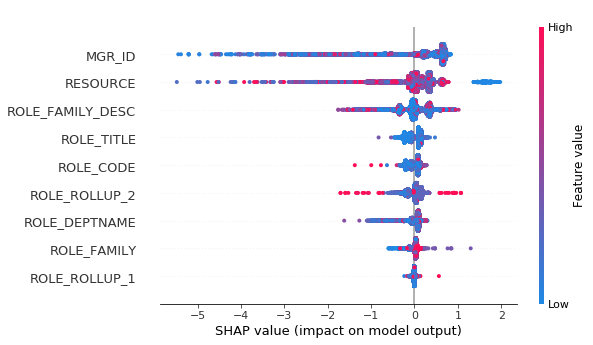

In [66]:
shap.summary_plot(shap_values[:,:-1], X)

From this graph you can see that values of MGR_ID and RESOURCE features have a large negative impact for many objects.
You can also see that RESOURCE has largest positive impact for many objects.

## Saving the model

You can save your model as a binary file. It is also possible to save the model as Python or C++ code.
If you save the model as a binary file you can then look on the parameters with which the model was trained, including learning_rate and random_seed that are set automatically if you don't specify them.

In [67]:
my_best_model = CatBoostClassifier(iterations=10)
my_best_model.fit(
    X_train, y_train,
    eval_set=(X_validation, y_validation),
    cat_features=cat_features,
    verbose=False
)
my_best_model.save_model('catboost_model.bin')

In [68]:
my_best_model.load_model('catboost_model.bin')
print(my_best_model.get_params())
print(my_best_model.random_seed_)
print(my_best_model.learning_rate_)

{'loss_function': 'Logloss', 'iterations': 10, 'logging_level': 'Silent', 'verbose': 0}
0
0.5


## Hyperparameter tunning

You can tune the parameters to get better speed or better quality.
Here is the list of parameters that are important for speed and accuracy.

### Training speed

Here is the list of parameters that are important for speeding up the training.
Note that changing this parameters might decrease the quality.
1. iterations + learning rate
By default we train for 1000 iterations. You can decrease this number, but if you decrease the number of iterations you need to increase learning rate so that the process converges. We set learning rate by default dependent on number of iterations and on your dataset, so you might just use default learning rate. But if you want to tune it, you need to know - the more iterations you have, the less should be the learning rate.

2. boosting_type
By default we use Ordered boosting for smaller datasets where we want to fight overfitting. This is expensive in terms of computations. You can set boosting_type to Plain to disable this.

3. bootstrap_type
By default we sample weights from exponential distribution. It is faster to use sampling from Bernoulli distribution. To enable that use bootstrap_type='Bernoulli' + subsample={some value < 1}

4. one_hot_max_size
By default we use one-hot encoding only for categorical features with little amount of different values. For all other categorical features we calculate statistics. This is expensive, and one-hot encoding is cheep. So you can speed up the training by setting one_hot_max_size to some bigger value

5. rsm
This parameter is very important, because it speeds up the training and does not affect the quality. So you should definitely use it, but only in case if you have hundreds of features.
If you have little amount of features it's better not to use this parameter.
If you have many features then the rule is the following: you decrease rsm, for example, you set rsm=0.1. With this rsm value the training needs more iterations to converge. Usually you need about 20% more iterations. But each iteration will be 10x faster. So the resulting training time will be faster even though you will have more trees in the resulting model.

6. leaf_estimation_iterations
This parameter is responsible for calculating leaf values after you have already selected tree structure.
If you have little amount of features, for example 8 or 10 features, then this place starts to be the bottle-neck.
Default value for this parameter depends on the training objective, you can try setting it to 1 or 5, and if you have little amount of features, this might speed up the training.

7. max_ctr_complexity
By default catboost generates categorical feature combinations in a greedy way.
This is time consuming, you can disable that by setting max_ctr_complexity=1 or by allowing only combinations of 2 features by setting max_ctr_complexity=2.
This will speed up the training only if you have categorical features.

8. If you are training the model on GPU, you can try decreasing border_count. This is the number of splits considered for each feature. By default it's set to 128, but you can try setting it to 32. In many cases it will not degrade the quality of the model and will speed up the training by a lot. 

In [69]:
from catboost import CatBoost
fast_model = CatBoostClassifier(
    random_seed=63,
    iterations=150,
    learning_rate=0.01,
    boosting_type='Plain',
    bootstrap_type='Bernoulli',
    subsample=0.5,
    one_hot_max_size=20,
    rsm=0.5,
    leaf_estimation_iterations=5,
    max_ctr_complexity=1,
    border_count=32)

fast_model.fit(
    X_train, y_train,
    cat_features=cat_features,
    logging_level='Silent',
    plot=True
)

A Jupyter Widget

In [70]:
# random_seed=0, default
def_model = CatBoostClassifier(
    random_seed=0,
    iterations=150,
    learning_rate=0.01,
    custom_loss='AUC',
)

def_model.fit(
    X_train, y_train,
    cat_features=cat_features,
    logging_level='Silent',
    plot=True
)

A Jupyter Widget

In [71]:
# random_seed=0
fast_model = CatBoostClassifier(
    random_seed=0,
    iterations=150,
    learning_rate=0.01,
    custom_loss = 'AUC',
    
    od_type='Iter',
    od_wait=20,
    boosting_type='Plain',
    bootstrap_type='Bernoulli',
    subsample=0.5,
    one_hot_max_size=20,
    rsm=0.5,
    leaf_estimation_iterations=5,
    max_ctr_complexity=1,
    border_count=32)

fast_model.fit(
    X_train, y_train,
    cat_features=cat_features,
    logging_level='Silent',
    plot=True
)

A Jupyter Widget

** Question 16: **

Try tunning the speed of the algorithm. What is the maximum speedup you could get by changing these parameters without decreasing of AUC on best iteration on eval dataset compared to AUC on best iteration after training with default parameters and random seed = 0?
The answer shoud be a number, for example 2.7 means you got 2.7 times speedup.

In [72]:
def_metrics = def_model.eval_metrics(data=pool1, metrics=['Logloss','AUC'], plot=True)

In [73]:
fast_metrics = fast_model.eval_metrics(data=pool1, metrics=['Logloss','AUC'], plot=True)

A Jupyter Widget

In [74]:
print("AUC on default model=",np.array(def_metrics['AUC'])[-1])
print("AUC on fast model=",np.array(fast_metrics['AUC'])[-1])

AUC on default model= 0.935602193313
AUC on fast model= 0.939611418474


A Jupyter Widget

In [75]:
speedup = 5.493/1.137
grader.submit_tag('speedup', speedup)

Current answer for task speedup is: 4.8311345646438


### Accuracy

The parameters listed below are important to get the best quality of the model. Try changing this parameters to improve the quality of the resulting model

In [76]:
tunned_model = CatBoostClassifier(
    random_seed=63,
    iterations=1000,
    learning_rate=0.03,
    l2_leaf_reg=3,
    bagging_temperature=1,
    random_strength=1,
    one_hot_max_size=2,
    leaf_estimation_method='Newton',
    depth=6
)
tunned_model.fit(
    X_train, y_train,
    cat_features=cat_features,
    logging_level='Silent',
    eval_set=(X_validation, y_validation),
    plot=True
)

A Jupyter Widget

In [77]:
tunned_metrics = tunned_model.eval_metrics(data=pool1, metrics=['AUC', 'Logloss'], plot=True)

In [78]:
# tunned test best = 0.13822

# https://catboost.ai/docs/concepts/parameter-tuning.html

grid = {'learning_rate': [0.03, 0.1],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 7, 9]}


tunned_model2 = CatBoostClassifier(
    random_seed=63,
    iterations=1000,
    #learning_rate=0.03,
    learning_rate=0.02,
    
    #l2_leaf_reg=3,
    l2_leaf_reg=5,
    
    bagging_temperature=1,
    random_strength=1,
    one_hot_max_size=20,
    leaf_estimation_method='Newton',
    
    #depth=6,
    depth=10,

    #random_seed=63,
    #iterations=1000,
    #learning_rate=0.03,
    
    #l2_leaf_reg=3,
    #bagging_temperature=1,
    #random_strength=1,
    #one_hot_max_size=2,
    #leaf_estimation_method='Newton',
    #depth=6,

    #od_type='Iter',
    #od_wait=20,
    #boosting_type='Plain',
    #bootstrap_type='Bernoulli',
    #subsample=0.5,
    #one_hot_max_size=20,
    #rsm=0.5,
    #leaf_estimation_iterations=5,
    #max_ctr_complexity=1,
    #border_count=32,
)

tunned_model2.fit(
    X_train, y_train,
    cat_features=cat_features,
    logging_level='Silent',
    eval_set=(X_validation, y_validation),
    plot=True
)

A Jupyter Widget

A Jupyter Widget

In [79]:
tunned_metrics2 = tunned_model2.eval_metrics(data=pool1, metrics=['AUC', 'Logloss'], plot=True)

In [80]:
print("AUC on tunned model=",np.array(tunned_metrics['AUC'])[tunned_model.best_iteration_])
print("AUC on tunned2 model=",np.array(tunned_metrics2['AUC'])[tunned_model2.best_iteration_])

AUC on tunned model= 0.984952202186
AUC on tunned2 model= 0.985817910483


A Jupyter Widget

** Question 17: **

Try tunning these parameters to make AUC on eval dataset as large as possible. What is the maximum AUC value you have reached?

In [81]:
# tunned_model AUC = 0.98495
final_auc = np.array(tunned_metrics2['AUC'])[tunned_model2.best_iteration_]
grader.submit_tag('final_auc', final_auc)

Current answer for task final_auc is: 0.985817910483


In [82]:
STUDENT_EMAIL = "junho.choi@gmail.com"# EMAIL HERE
STUDENT_TOKEN = "" # TOKEN HERE
grader.status()

You want to submit these numbers:
Task negative_samples: 1897
Task positive_samples: 30872
Task resource_unique_values: 7518
Task logloss_mean: 0.138180847126
Task logloss_std: 0.000777781825619
Task accuracy_6: 0.9539212694537686
Task best_model_name: learning_rate_0.05
Task num_trees: 100
Task mean_logloss_cv: 0.140862080899
Task logloss_std_1: 0.0055622410138
Task iterations_overfitting: 64
Task auc_550: 0.984975697775
Task feature_importance_top3: RESOURCE,MGR_ID,ROLE_DEPTNAME
Task most_important: RESOURCE
Task shap_influence: -1
Task speedup: 4.8311345646438
Task final_auc: 0.985817910483


In [83]:
grader.submit(STUDENT_EMAIL, STUDENT_TOKEN)

You used an invalid email or your token may have expired. Please make sure you have entered all fields correctly. Try generating a new token if the issue still persists.
